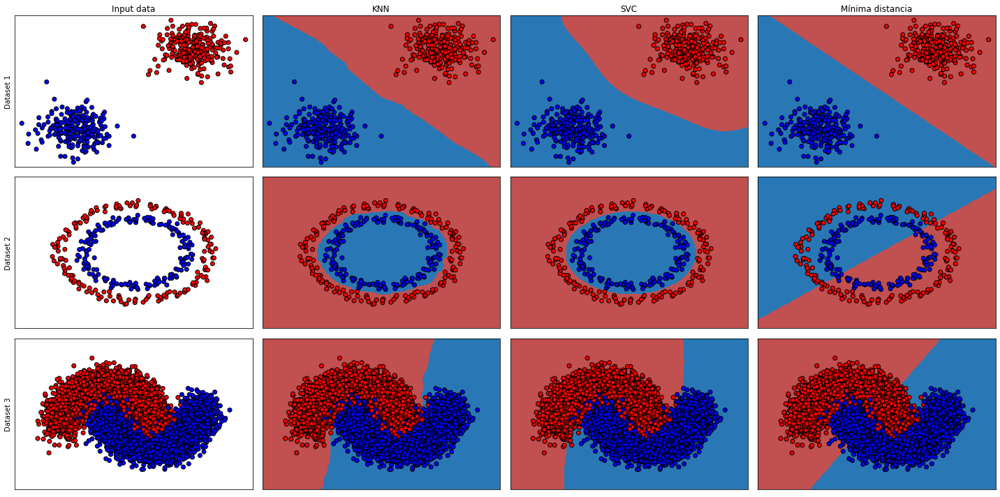

In [18]:
"""
Code from: https://scikit-learn.org/stable/auto_examples/classification/plot_classifier_comparison.html#sphx-glr-auto-examples-classification-plot-classifier-comparison-py

Adapted for ML Practice for: David Pedroza Segoviano
"""

# Importing Important Imports
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import NearestCentroid
from sklearn.svm import SVC
from sklearn.model_selection import cross_val_score
# Importing something for file reading
from algorithms.read import read_files

# step size in the mesh
h = .02

# List of names of the classifier 
names = ["KNN", "SVC", 'Mínima distancia']
# List of the classifier
classifiers = [
    KNeighborsClassifier(5),
    SVC(kernel="rbf", C=10, gamma=0.1),
    NearestCentroid()]

# Reading my datasets (there are 3 of them)
datasets = read_files()

# Creating a figure
figure = plt.figure(figsize=(20, 10))
i = 1 # Subplot index

scores = {}

# iterate over datasets
for ds_cnt, ds in enumerate(datasets):
    # Separate our data into coords (x1,x2) and label (y)
    X, y = ds
    # Calculate the max and the min for meshgrid creation
    x_min, x_max = X[:, 0].min() - .5, X[:, 0].max() + .5
    y_min, y_max = X[:, 1].min() - .5, X[:, 1].max() + .5
    # Meshgrid creation
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))

    # Plot the dataset
    cm = ListedColormap(['#c15050','#2978b5']) # Decision Boundary colors
    cm_bright = ListedColormap(['#FF0000', '#0000FF']) # Points color
    ax = plt.subplot(len(datasets), len(classifiers) + 1, i) # Subplot
    
    # Set the title
    if ds_cnt == 0:
        ax.set_title("Input data")
    
    # Plot the data points
    ax.scatter(X[:, 0], X[:, 1], c=y, cmap=cm_bright,
               edgecolors='k')

    # Set some plotting things
    ax.set_xlim(xx.min(), xx.max())
    ax.set_ylim(yy.min(), yy.max())
    ax.set_ylabel(f"Dataset {ds_cnt+1}") # Dataset name
    ax.set_yticks(())
    ax.set_xticks(())
  
    i += 1 # Index + 1
    # Defining the matrix for k-fold cross validation
    scores[f'dataset{ds_cnt+1}'] = []
    # Iterate over classifiers
    for name, clf in zip(names, classifiers):
        ax = plt.subplot(len(datasets), len(classifiers) + 1, i)
        clf.fit(X, y) # Train the classifier with the dataset

        # Assing a color to each point in the mesh
        # Depending on the classifier
        Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])

        # Put the result into a color plot
        Z = Z.reshape(xx.shape)
        # Plot the Decision Boundary color
        ax.contourf(xx, yy, Z, cmap=cm, alpha=1)

        # Plot again the points
        ax.scatter(X[:, 0], X[:, 1], c=y, cmap=cm_bright,
               edgecolors='k')

        # Set up some graph properties 
        ax.set_xlim(xx.min(), xx.max())
        ax.set_ylim(yy.min(), yy.max())
        ax.set_xticks(())
        ax.set_yticks(())
        if ds_cnt == 0:
            ax.set_title(name)
        i += 1 # Index


        ### ----- K-Fold cross validation ----- ###
        # Now we calculate the 10-Fold cross validation
        scores[f'dataset{ds_cnt+1}'].append(cross_val_score(clf, X, y, cv=10))
        # I stashed them in a scores matrix.

# Converting scores to numpy
for key in scores.keys():
    scores[key] = np.array(scores[key])
    scores[key] = scores[key].T

# Plotting the solution
plt.tight_layout()
plt.savefig('Fronteras_De_Decision.jpg')
plt.show()

In [24]:
import pandas as pd
dataset1 = scores['dataset1']
dataset2 = scores['dataset2']
dataset3 = scores['dataset3']

In [32]:
df1 = pd.DataFrame(dataset1, columns=names)
index = df1.index
index.name = "Dataset 1"

df2 = pd.DataFrame(dataset2, columns=names)
index = df2.index
index.name = "Dataset 2"

df3 = pd.DataFrame(dataset3, columns=names)
index = df3.index
index.name = "Dataset 3"

In [33]:
df1

,KNN,SVC,Mínima distancia
Dataset 1,,,
0,1.0,1.0,1.0
1,1.0,1.0,1.0
2,1.0,1.0,1.0
3,1.0,1.0,1.0
4,1.0,1.0,1.0
5,1.0,1.0,1.0
6,1.0,1.0,1.0
7,1.0,1.0,1.0
8,1.0,1.0,1.0


In [34]:
df2

,KNN,SVC,Mínima distancia
Dataset 2,,,
0,1.0,1.0,0.400000
1,1.0,1.0,0.342857
2,1.0,1.0,0.485714
3,1.0,1.0,0.428571
4,1.0,1.0,0.257143
5,1.0,1.0,0.457143
6,1.0,1.0,0.342857
7,1.0,1.0,0.457143
8,1.0,1.0,0.485714


In [35]:
df3

,KNN,SVC,Mínima distancia
Dataset 3,,,
0,0.974,0.958,0.796
1,0.970,0.962,0.773
2,0.965,0.956,0.785
3,0.971,0.953,0.811
4,0.959,0.956,0.788
5,0.967,0.961,0.780
6,0.972,0.954,0.777
7,0.959,0.958,0.795
8,0.964,0.955,0.782
